In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [24]:
sns.set_context('talk')

In [15]:
df.to_pickle('CCPA.pkl.gz')

In [16]:
df = pd.read_pickle('CCPA.pkl.gz')

day  sample   FL  culture  logFL  cumsumFL  \
experiment PRO     ALT                                                   
e1         C9B     1A3      264     264  264      264    264       264   
                   ATCC      88      88   88       88     88        88   
                   Ax_Pro    88      88   88       88     88        88   
                   BS11     264     264  264      264    264       264   
                   DE       264     264  264      264    264       264   
                   DE1      264     264  264      264    264       264   
           MED4    1A3      264     264  264      264    264       264   
                   ATCC     264     264  264      264    264       264   
                   Ax_Pro   264     264  264      264    264       264   
                   BS11     264     264  264      264    264       264   
                   DE       264     264  264      264    264       264   
                   DE1      264     264  264      264    264       264   
           MIT9312 1A3      264     264  264      264    264       264   
                   ATCC     264     264  264      264    264       264   
                   Ax_Pro   264     264  264      264    264       264   
                   BS11     264     264  264      264    264       264   
                   DE       264     264  264      264    264       264   
                   DE1      264     264  264      264    264       264   
           MIT9313 1A3      264     264  264      264    264       264   
                   ATCC     264     264  264      264    264       264   
                   Ax_Pro   264     264  264      264    264       264   
                   BS11     264     264  264      264    264       264   
                   DE       264     264  264      264    264       264   
                   DE1      264     264  264      264    264       264   
           Natl2A  1A3      264     264  264      264    264       264   
                   ATCC     264     264  264      264    264       264   
                   Ax_Pro   264     264  264      264    264       264   
                   BS11     264     264  264      264    264       264   
                   DE       264     264  264      264    264       264   
                   DE1      264     264  264      264    264       264   
...                         ...     ...  ...      ...    ...       ...   
e6         Natl2A  DE1      162     162  162      162    162       162   
           all     all      162     162  162      162    162       162   
           allP    all_Pro  108     108  108      108    108       108   
e7         C9B     1A3      159     159  159      159    159       159   
                   ATCC      53      53   53       53     53        53   
                   BS11     159     159  159      159    159       159   
                   DE       159     159  159      159    159       159   
                   DE1      159     159  159      159    159       159   
           MED4    1A3      159     159  159      159    159       159   
                   ATCC     159     159  159      159    159       159   
                   BS11     159     159  159      159    159       159   
                   DE       159     159  159      159    159       159   
                   DE1      159     159  159      159    159       159   
           MIT9312 1A3      159     159  159      159    159       159   
                   ATCC     159     159  159      159    159       159   
                   BS11     106     106  106      106    106       106   
                   DE       159     159  159      159    159       159   
                   DE1      159     159  159      159    159       159   
           MIT9313 1A3      106     106  106      106    106       106   
                   ATCC     159     159  159      159    159       159   
                   BS11     159     159  159      159    159       159   
                   DE       159 

# Features from Curves

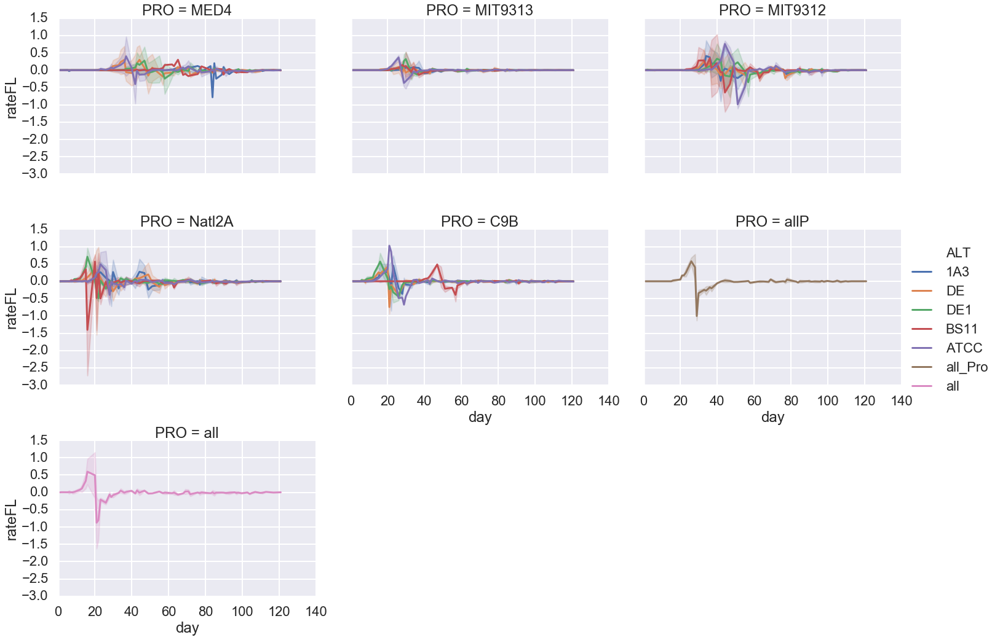

In [17]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='rateFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

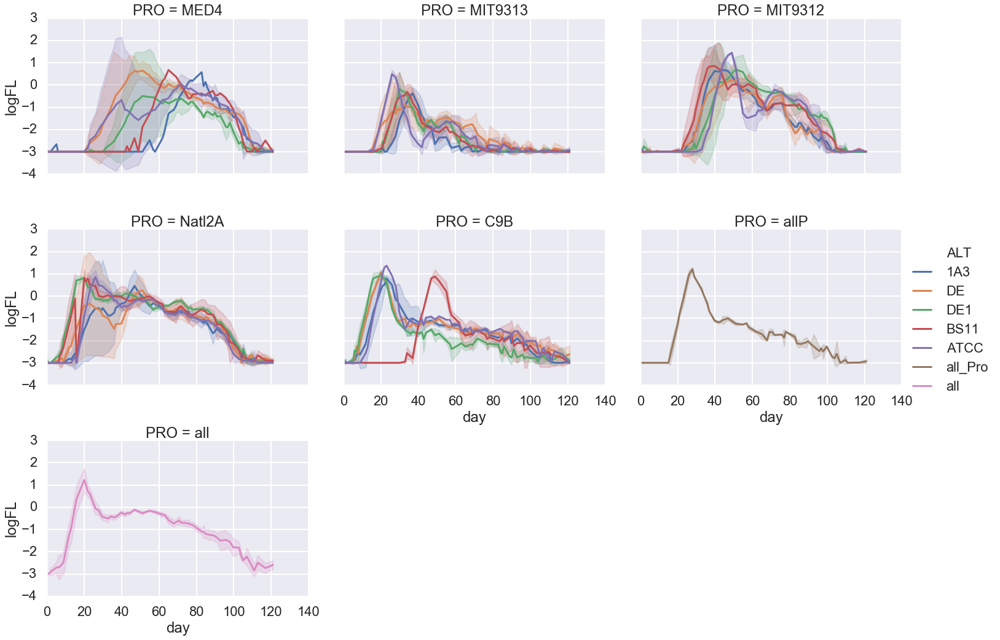

In [18]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='logFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

Compute the following features based on a growth curve:

1. lag phase: time until the first growth
   - lag phase end time
   - lag phase max value
   (startThreashold = Application.WorksheetFunction.Max(yvalues) + 4 * (Application.WorksheetFunction.StDev(yvalues)))
2. growth phase: growth till max value
   - growth max value
   - growth diff (growth max value - lag phase max value)
   - growth end time
   - growth time (growth end time - lag phase end time
   - growth rate (growth diff / growth time)
   
3. stationary phase
   -


4. decline phase
   - decline time - total time to get to 0.5
   - half yield - time to get to 1/2 growth max value
       (halfDeclineTime = (halfYield - beforeHalf + (declinePointsSlope * beforeHalfTime)) / declinePointsSlope)
       (halfLife = halfDeclineTime - maxTime)
   - tenth yield - time to get to 1/10 growth max value
   - decline rate
   - number of spikes
   

5. global params
  - AUC - area under the curve

In [27]:
d = df.loc[(df.experiment == 'e5') & (df['sample'] == '37C')]
t = cp.analyze_curve(d)

with pd.option_context('display.max_rows', -1):
    print(t)


                                2.919
max                           1.07124
max_log                         15.87
max_day                          0.05
min                          -2.99573
min_log                            e5
experiment                        37C
sample                            all
PRO                               all
ALT                       All_strains
culture                         14.99
growth_half_day                 2.024
growth_half_val                 11.88
growth_log_half_day         -0.578034
growth_log_half_val               8.8
growth_tenth_day                0.143
growth_tenth_val                 5.11
growth_log_tenth_day         -2.60369
growth_log_tenth_val         -3.52889
growth_log_intercept         0.253952
growth_log_coefficient       0.903555
growth_log_score_r2           7.66443
growth_auc                   -25.0523
growth_logauc                   2.869
growth_diff                   4.06697
growth_diff_log              0.586583
growth_mean 

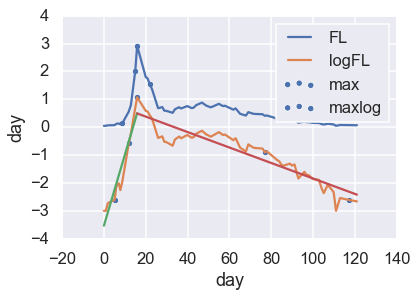

In [28]:
cp.display_features(d, cp.analyze_curve(d))


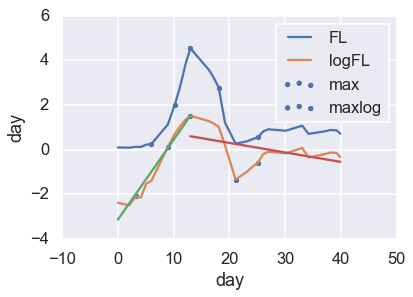

In [129]:
d = df.loc[(df.experiment == 'e2') & (df['sample'] == '23C')]
cp.display_features(d, cp.analyze_curve(d))


In [65]:
np.log(0.1)

-2.3025850929940455

In [30]:
g = cp.generate_features(df)

In [31]:
g.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'experiment', 'sample',
       'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decay_half_day',
       'decay_half_val', 'decay_log_half_day', 'decay_log_half_val',
       'decay_tenth_day', 'decay_tenth_val', 'decay_log_tenth_day',
       'decay_log_tenth_val', 'decay_log_intercept', 'decay_lo

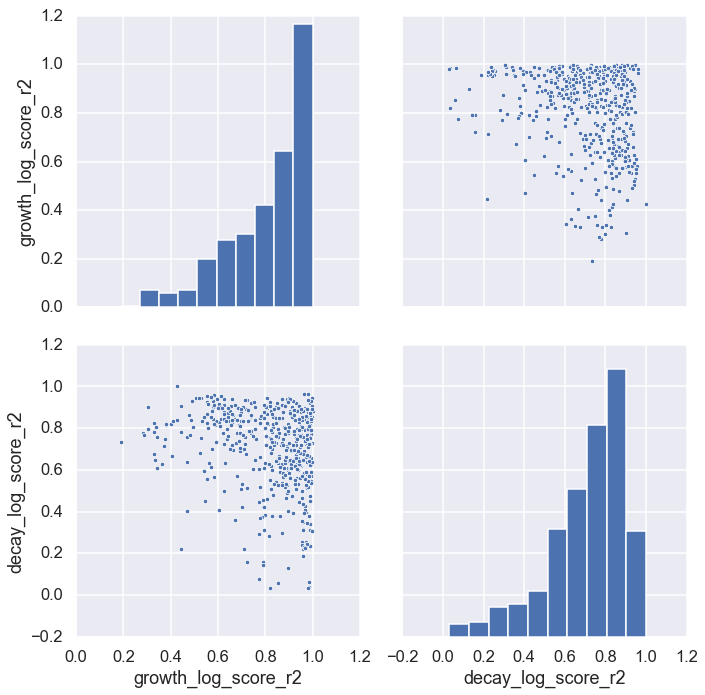

In [32]:
#sns.pairplot(data=g.loc[[]], x='growth_log_score_r2' ,y='decay_log_score_r2')
sns.pairplot(data=g.loc[g.max_day > -1,['growth_log_score_r2' ,'decay_log_score_r2']], height=5)

In [147]:
g.loc[(g['decay_log_score_r2'] <0.5) & (g['ALT'] != 'Ax_Pro') & (g['experiment'] != 'e2'),['experiment', 'PRO', 'ALT'# ,'growth_log_score_r2' ,'decay_log_score_r2'
                                   ]]

,experiment,PRO,ALT
experiment_sample,,,
"e1, 14C",e1,Natl2A,DE1
"e1, 9B",e1,Natl2A,DE
"e1, 9C",e1,Natl2A,DE
"e3, 10A",e3,C9B,DE
"e3, 10B",e3,C9B,DE
"e3, 10C",e3,C9B,DE
"e3, 12A",e3,MIT9313,DE1
"e3, 12B",e3,MIT9313,DE1
"e3, 22C",e3,MIT9313,ATCC


In [140]:
f = g.loc[(g['decay_log_score_r2'] <0.3) & (g['ALT'] != 'Ax_Pro') & (g['experiment'] != 'e2'),['experiment']].index
f

Index(['e3, 12B', 'e4, 12A', 'e4, 12B', 'e4, 12C', 'e4, 17B', 'e4, 17C',
       'e4, 2A', 'e4, 2C', 'e4, 7A', 'e4, 7B', 'e4, 7C'],
      dtype='object', name='experiment_sample')

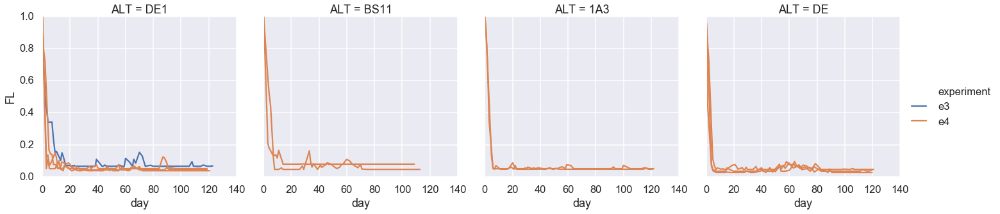

In [148]:
sns.relplot(data=dfd.loc[dfd.experiment_sample.isin(f)], x='day', y='FL', kind='line', units='experiment_sample', estimator=None, hue='experiment', 
            col='ALT', dashes='experiment')

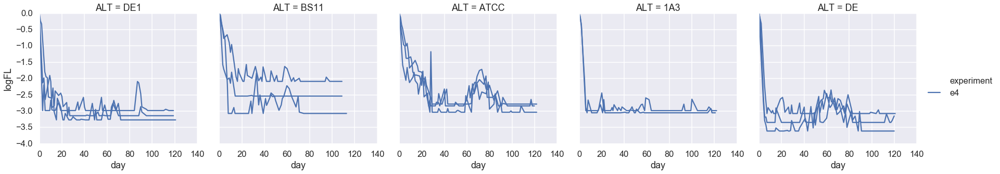

In [154]:
sns.relplot(data=dfd.loc[(dfd.experiment == 'e4') & (dfd.PRO=='MIT9313')], 
            x='day', y='logFL', kind='line', 
            units='experiment_sample', estimator=None, hue='experiment', 
            col='ALT', dashes='experiment')

In [34]:
meta_cols = ['sample', 'experiment','PRO', 'ALT', 'culture', 'experiment_sample']
feature_cols = g.columns.difference(meta_cols)

In [35]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample')

C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


Variance percent explained
 [0.43301387 0.10662931]


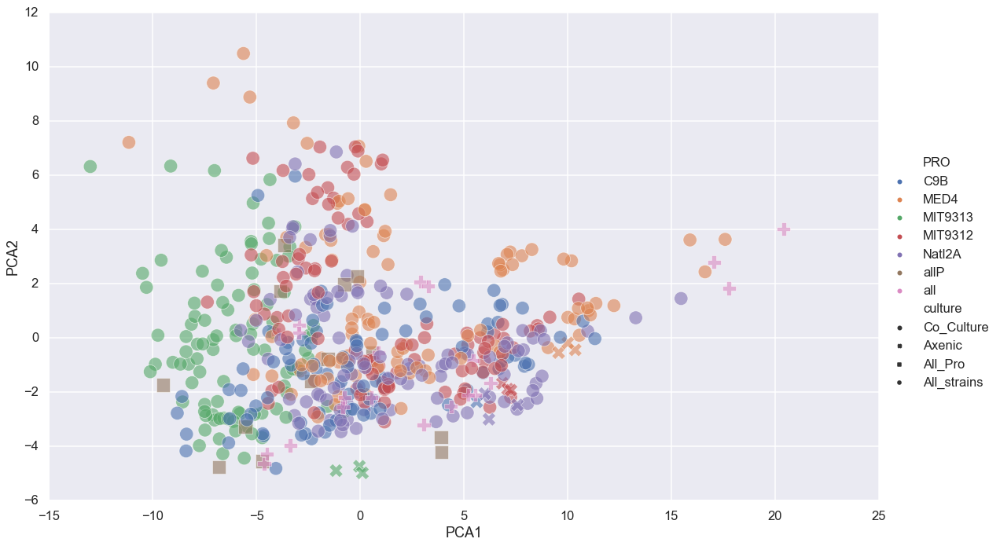

In [36]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, alpha=0.6, height=10, aspect=1.6)

No handles with labels found to put in legend.


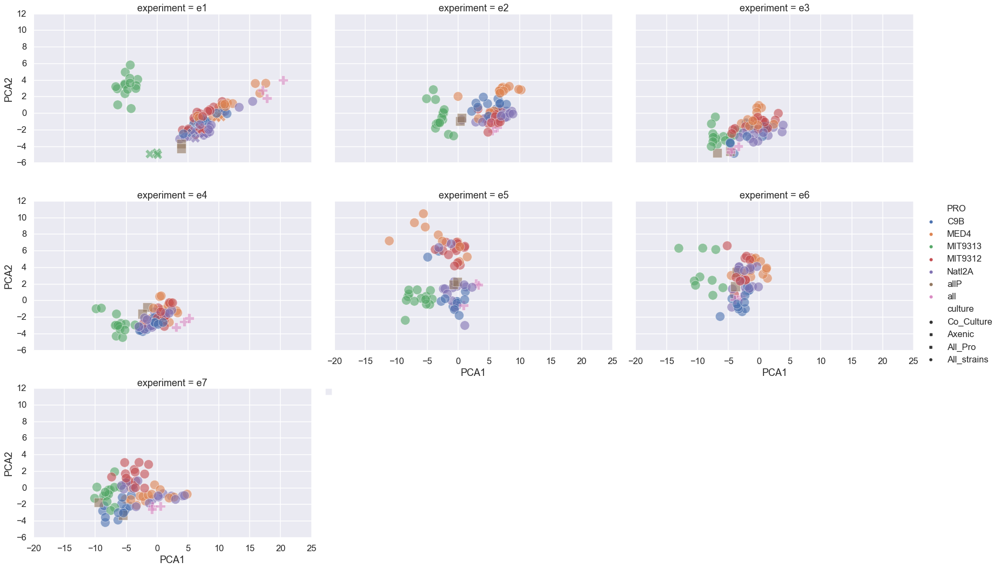

In [37]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, alpha=0.6,
            col='experiment', col_wrap=3, height=5, aspect=1.6)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [38]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample', n_components=3)


Variance percent explained
 [0.43301387 0.10662931 0.07531489]


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


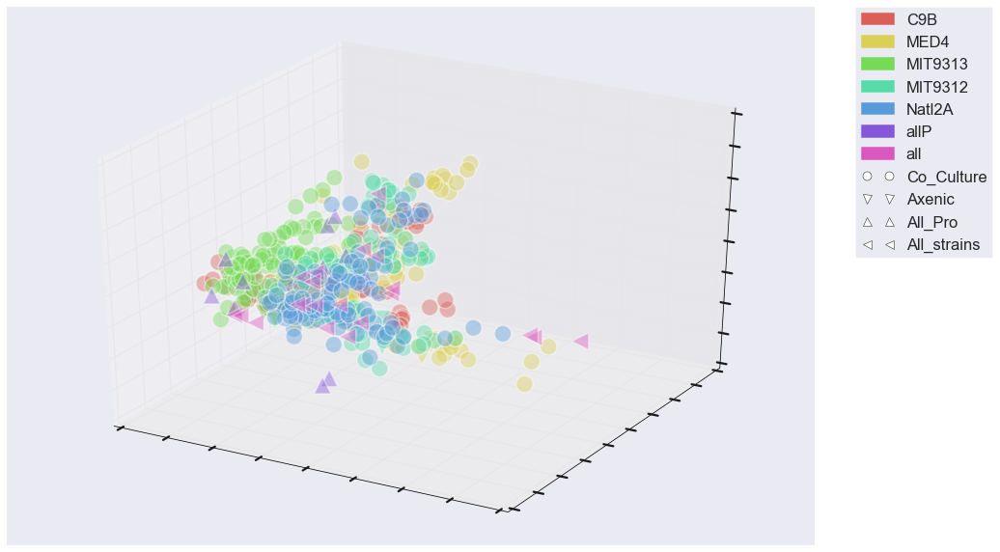

In [39]:
cp.display_pca_3d(dfpca, color_col='PRO', style_col='culture')

plt.show()

In [40]:
X = cp.features2X(g)
y = g['PRO']
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

0.5850467289719626


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


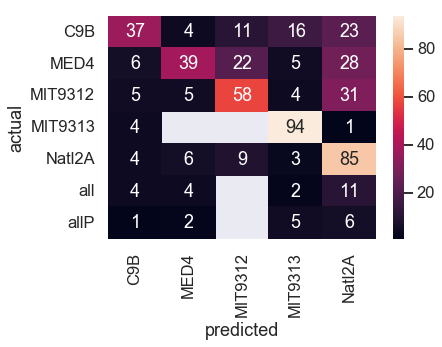

In [41]:
cp.forest_heatmap(clf=clf, X=X, y=y)

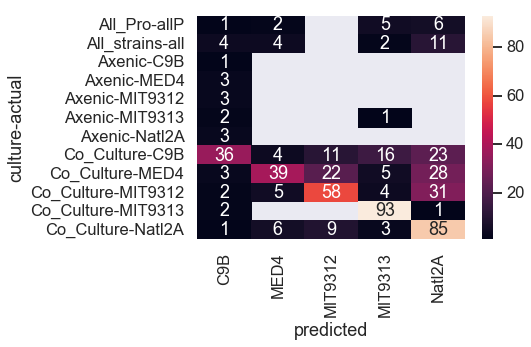

In [42]:
m= metadf.set_index(keys='experiment_sample')
cp.forest_heatmap(clf=clf, X=X, y=y, metadf=m, breakdown='culture')

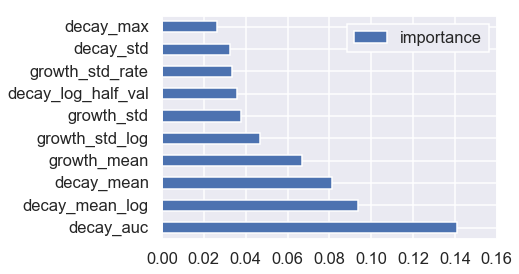

In [43]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [44]:
g2 = g.loc[(g.experiment == 'e1') | 
               (g.experiment == 'e3') |
               (g.experiment == 'e4') |
               (g.experiment == 'e5') |
               (g.experiment == 'e6') 
              ]

In [45]:
X = cp.features2X(g2)
y = g2['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5984251968503937


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


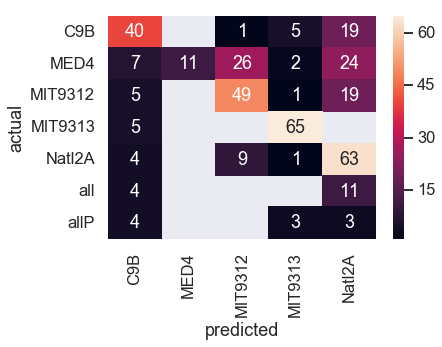

In [46]:
cp.forest_heatmap(clf=clf, X=X, y=y)

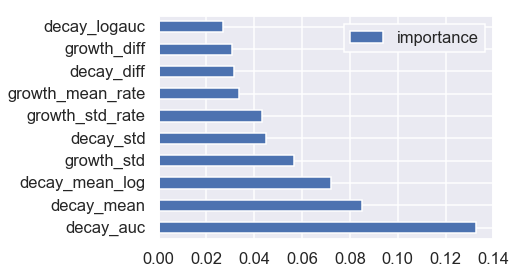

In [47]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [48]:
X = cp.features2X(g2)
y = g2['ALT']
clf = cp.forest_classifier(X=X, y=y)

0.4094488188976378


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


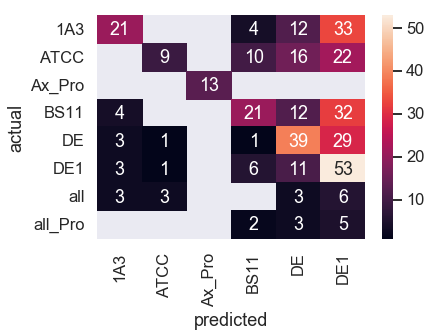

In [49]:
cp.forest_heatmap(clf=clf, X=X, y=y)

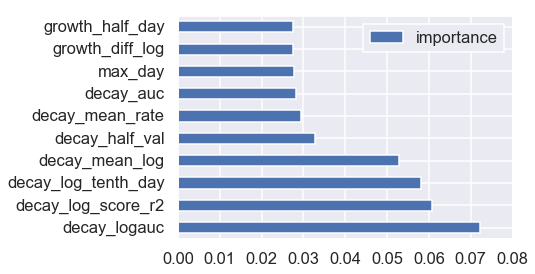

In [50]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Comparison of all Experiments

In [51]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = df.pivot(index='experiment_sample', columns='day', values='logFL')
# X.fillna(method='pad', inplace=True)
# scaledX = StandardScaler().fit_transform(X)
# pca = PCA(n_components=2)
# principalComponents = pca.fit_transform(scaledX)
# print('Variance percent explained\n', pca.explained_variance_ratio_)
# principalDf = pd.DataFrame(data = principalComponents
#              , columns = ['PCA1', 'PCA2'])
# principalDf.set_index(X.index, inplace=True)
# meta = meta_dfs[0]
# dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')


In [52]:
X = cp.experiments2X(df, sample_col='experiment_sample')
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.85347805 0.0903611 ]


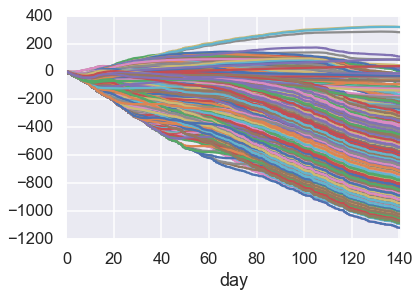

In [53]:
X.T.plot(legend=False)

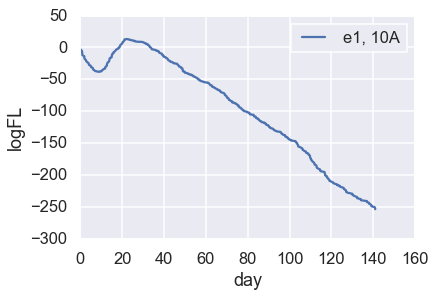

In [54]:
n = 'e1, 10A'
plt.plot(X.T[n])
d= df.loc[(df.experiment_sample == 'n')]
#d['cumsumlogFL'] = d.logFL.transform(pd.Series.cumsum)
sns.lineplot(data=d,x='day', y='logFL')


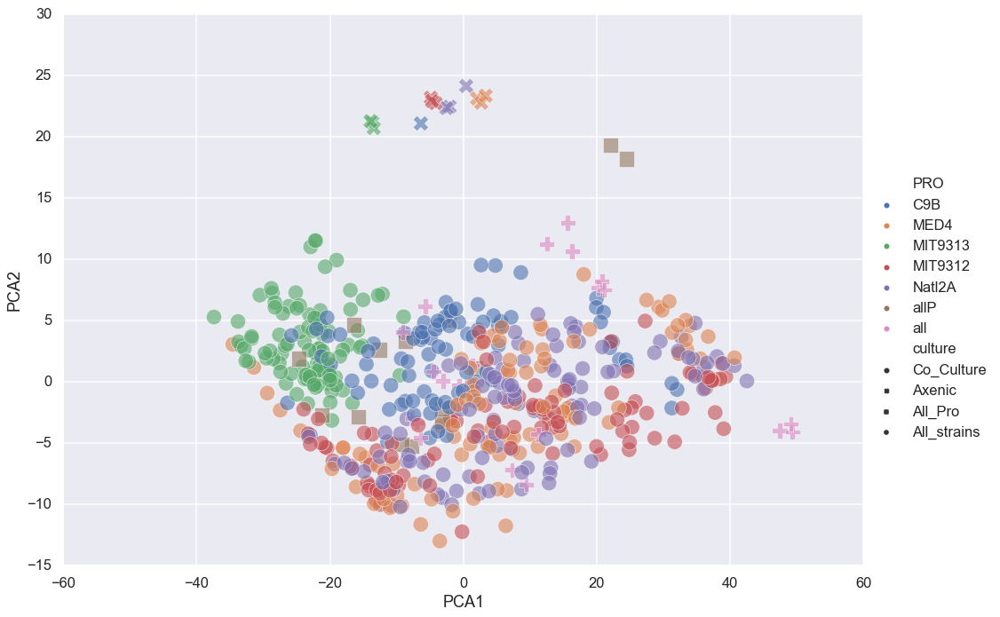

In [55]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300,alpha=0.6,
             height=10, aspect=1.4)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

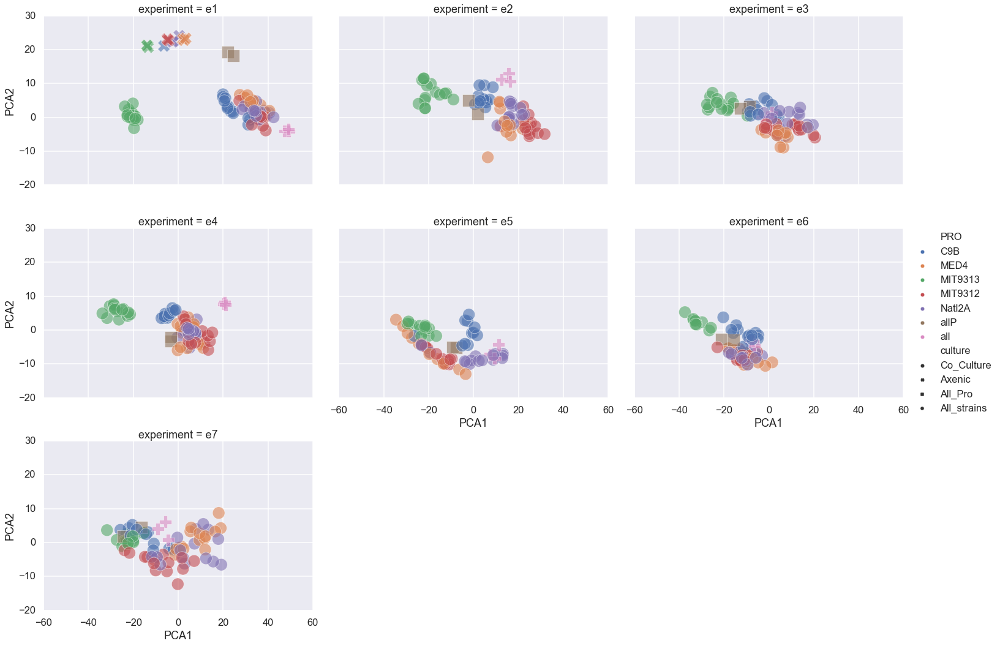

In [56]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=400, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

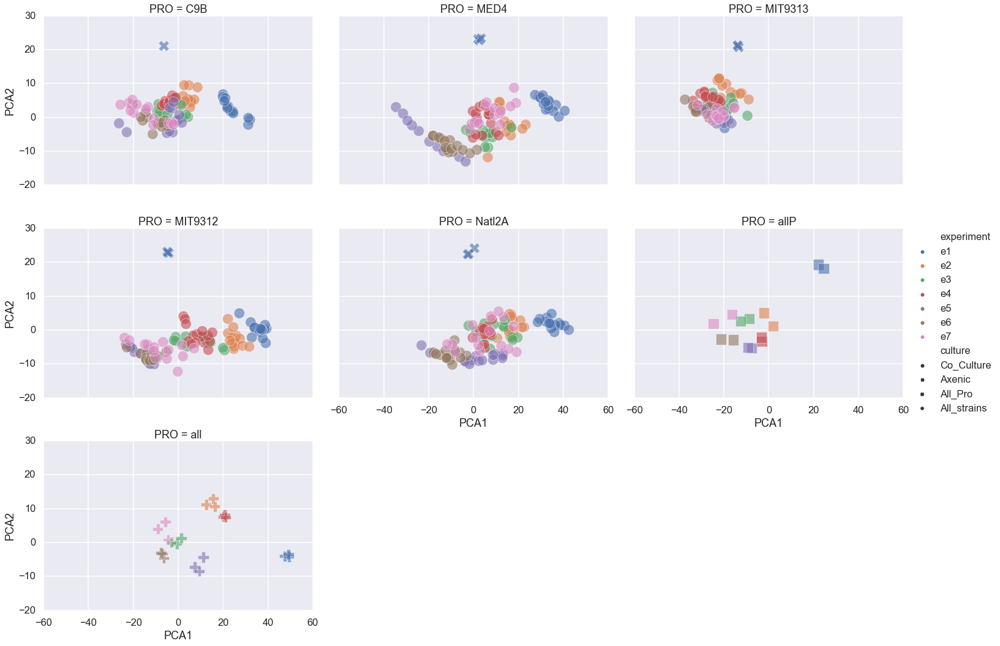

In [57]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300, alpha=0.6,
            col='PRO', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

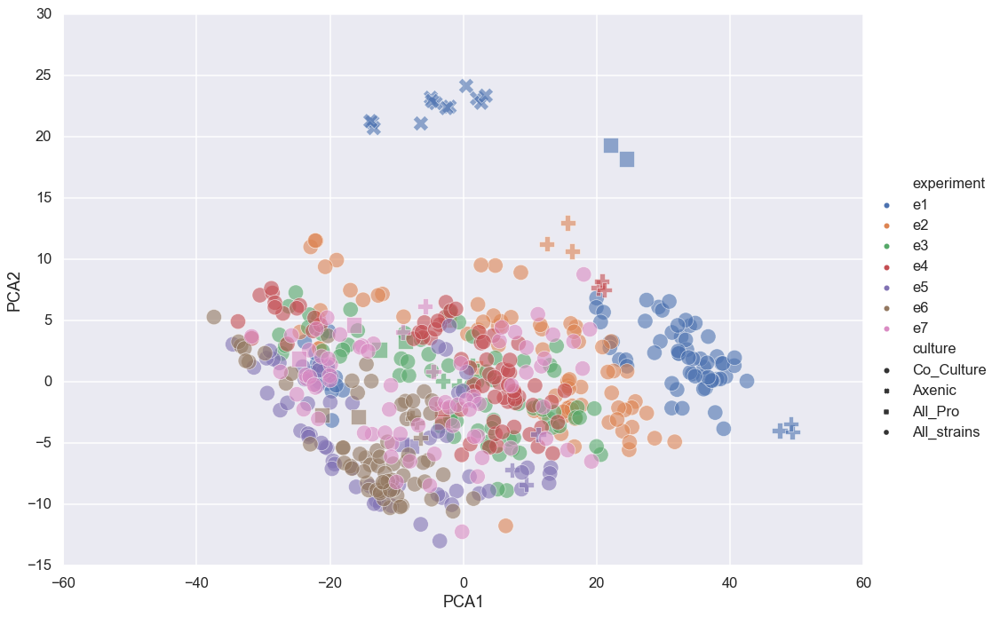

In [58]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300,  
            aspect=1.4, height=10, alpha=0.6,
           # col='PRO', aspect=1.4, col_wrap=3
           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

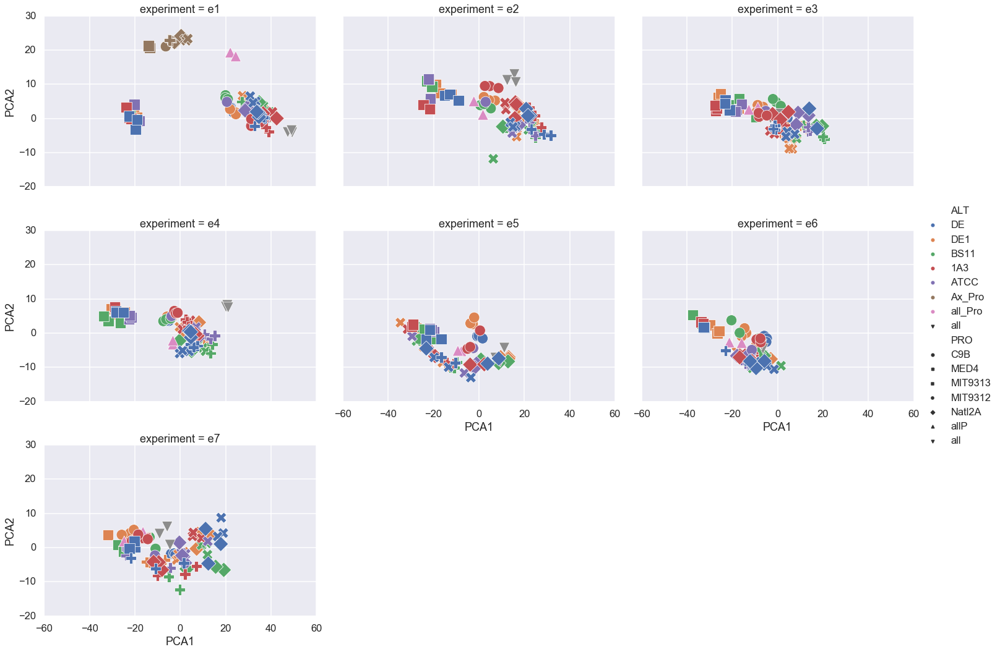

In [59]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='PRO',s=300, height=5,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [60]:
X = cp.experiments2X(df)
metadf = cp.get_meta(df)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4542056074766355


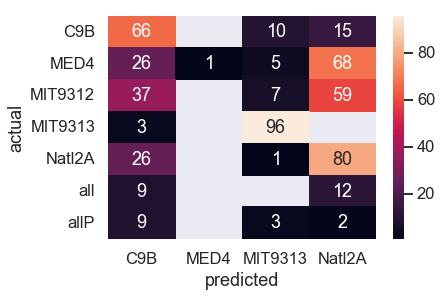

In [61]:
cp.forest_heatmap(clf=clf, X=X, y=y)

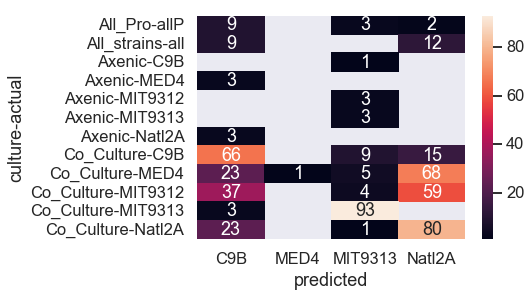

In [62]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

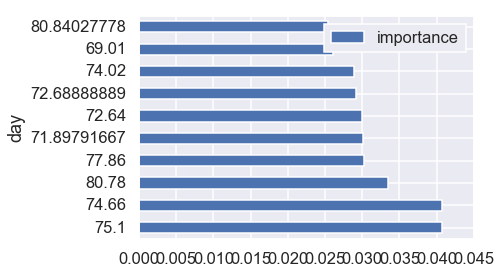

In [63]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Decay Curve

In [64]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample,FL_orig
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,-2.017406,0.133,-2.017406,-0.588889,NaN,NaN,NaN,NaN,NaN,"e1, 1A",0.133
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,-1.838851,0.292,-3.856257,-0.575917,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A",0.159
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,-1.864330,0.447,-5.720587,-0.577913,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A",0.155
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,-1.714798,0.627,-7.435386,-0.565440,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A",0.180
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,-0.458866,1.259,-7.894252,-0.339936,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A",0.632


In [72]:
dfd = cp.generate_decay(df, sample_col='experiment_sample')


In [73]:
dfd = cp.update_calculated_fields(dfd, group_col='experiment_sample',min_fl=None)


C:\Users\Osnat\Anaconda3\lib\site-packages\scipy\stats\stats.py:2281: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


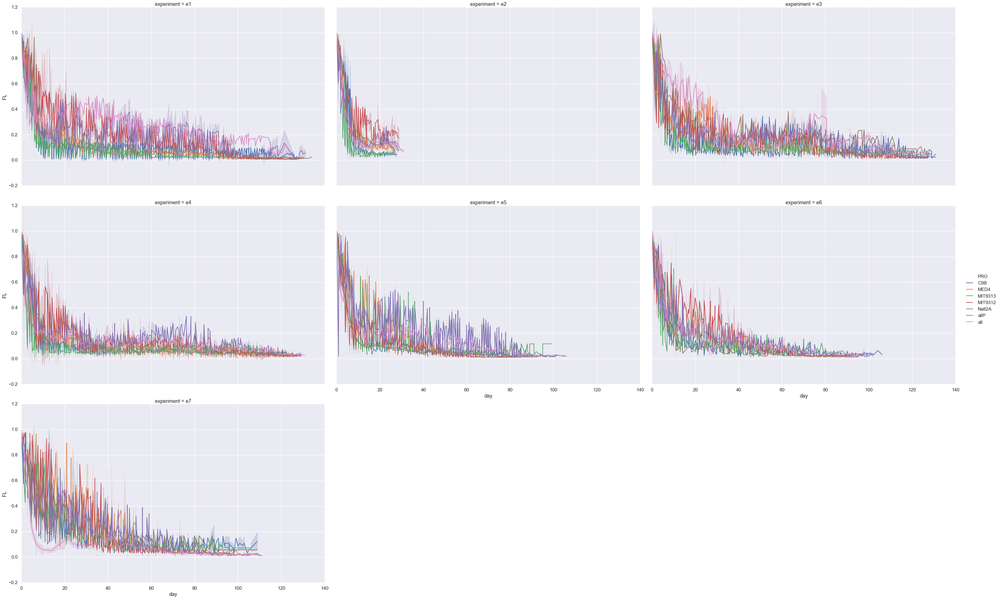

In [74]:
sns.relplot(data=dfd, x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

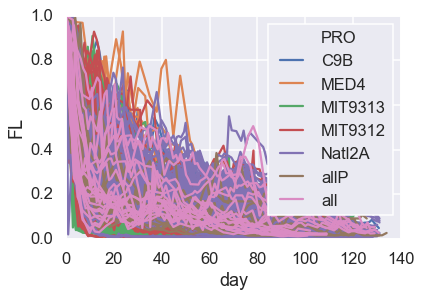

In [76]:
sns.lineplot(data=dfd, x='day', y='FL',    units='experiment_sample', estimator=None, hue='PRO', dashes='experiment')

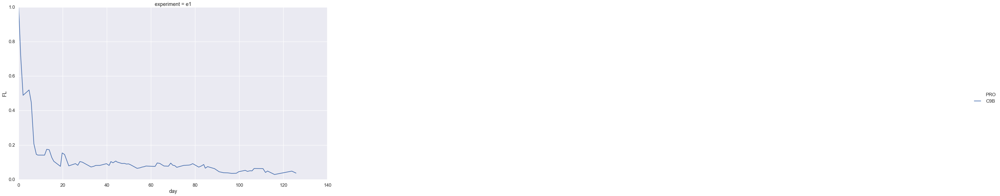

In [77]:
sns.relplot(data=dfd.loc[dfd.experiment_sample == 'e1, 10A'], x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

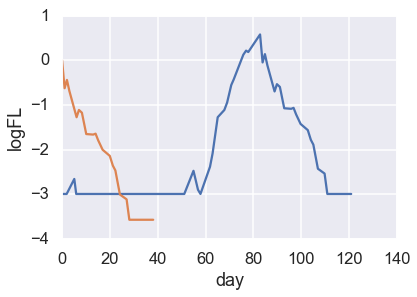

In [93]:
x_col='day'
esample = 'e1, 11B'
esample = 'e7, 9C'
esample = 'e1, 36B'
esample = 'e5, 1C'
sns.lineplot(data=df.loc[df.experiment_sample == esample], x=x_col, y='logFL')
sns.lineplot(data=dfd.loc[dfd.experiment_sample == esample], x=x_col, y='logFL')


In [155]:
max_day = dfd.loc[dfd.experiment.isin(['e5','e3','e4'])].groupby('experiment_sample')['day'].max()

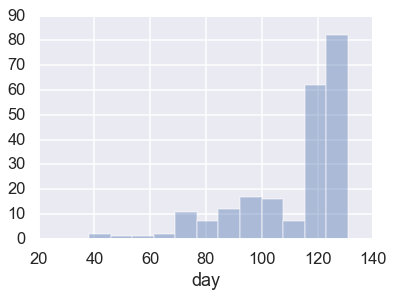

In [156]:
sns.distplot(max_day,kde=False)
#max_day.sort_values().head(30)


In [169]:
max_day.sort_values()[max_day.sort_values() < 78]

experiment_sample
e5, 1C     38.11
e5, 11C    43.04
e5, 21B    49.12
e5, 16B    55.82
e5, 13B    65.95
e5, 11B    65.95
e5, 6B     69.80
e5, 23C    71.95
e5, 23A    71.95
e5, 20C    71.95
e5, 9A     71.95
e5, 8A     71.95
e5, 6C     74.03
e5, 20B    74.03
e5, 11A    74.03
e5, 3B     74.03
e5, 4C     74.03
Name: day, dtype: float64

In [170]:
keep = max_day.loc[max_day > 78].index
keep

Index(['e3, 10A', 'e3, 10B', 'e3, 10C', 'e3, 11A', 'e3, 11B', 'e3, 11C',
       'e3, 12A', 'e3, 12B', 'e3, 12C', 'e3, 13A',
       ...
       'e5, 5B', 'e5, 5C', 'e5, 6A', 'e5, 7A', 'e5, 7B', 'e5, 7C', 'e5, 8B',
       'e5, 8C', 'e5, 9B', 'e5, 9C'],
      dtype='object', name='experiment_sample', length=203)

In [171]:
dfd1 = dfd.loc[dfd.experiment_sample.isin(keep)]

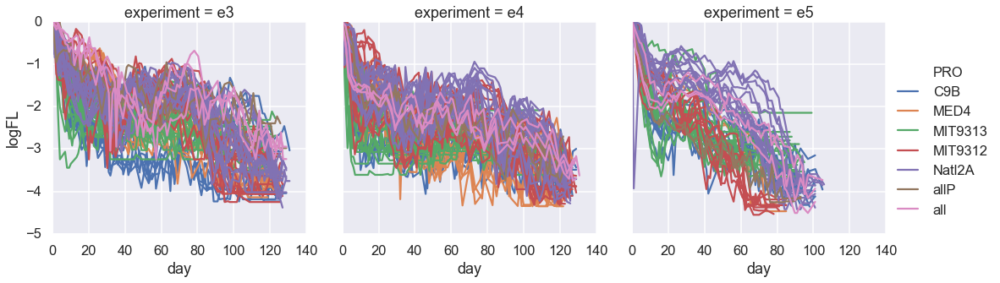

In [173]:
sns.relplot(data=dfd1, x='day', y='logFL', col='experiment', kind='line', hue='PRO',
             units='experiment_sample', estimator=None, col_wrap=3)

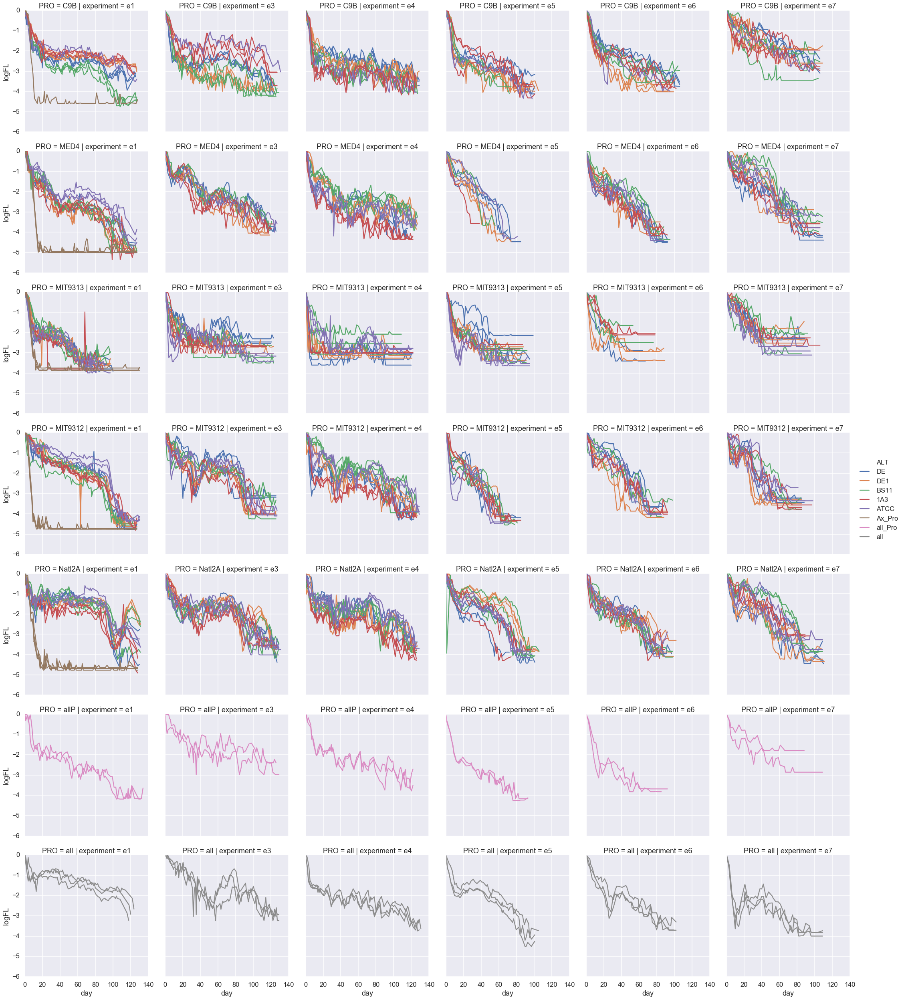

In [97]:
sns.relplot(data=dfd.loc[dfd.experiment != 'e2'], x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

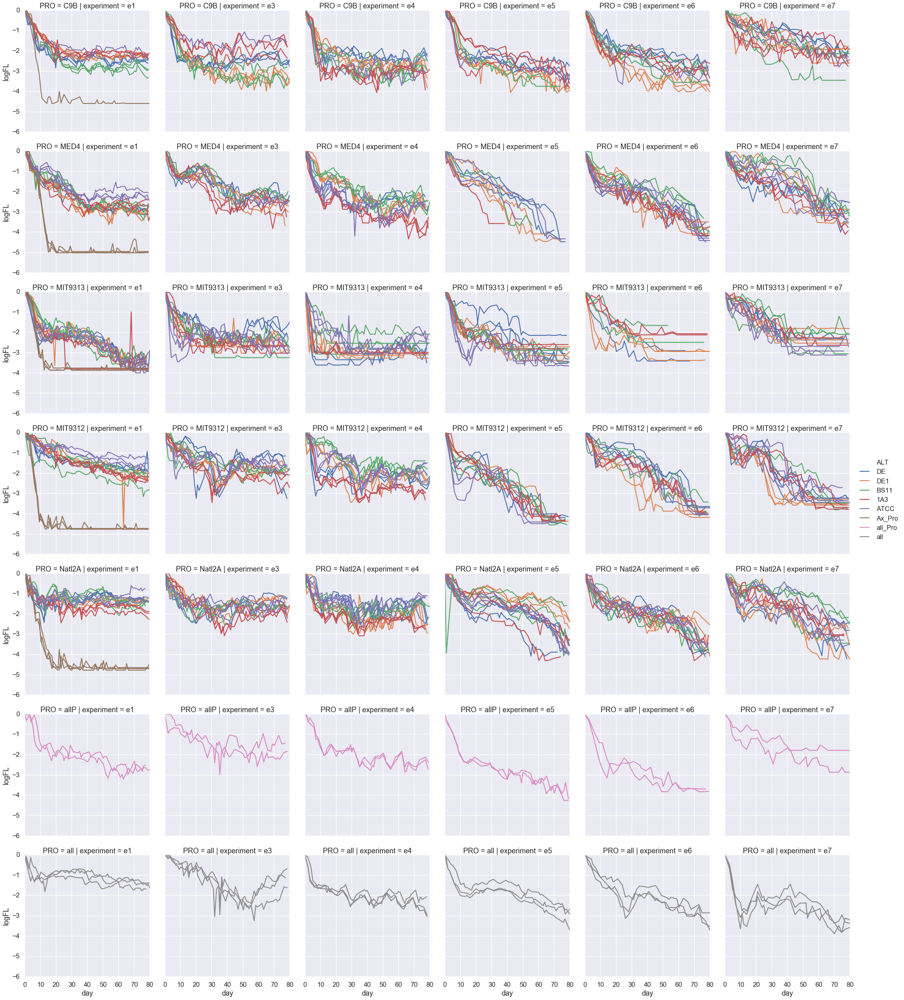

In [98]:
sns.relplot(data=dfd.loc[(dfd.experiment != 'e2') & (dfd.day < 80)], 
            x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

In [99]:
(max_day > 100).sum()

293

In [100]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.84526869 0.096409  ]


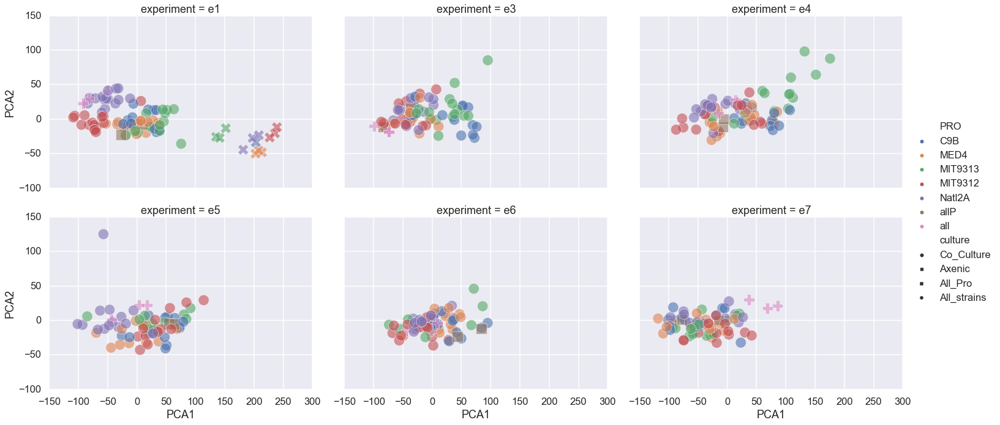

In [101]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

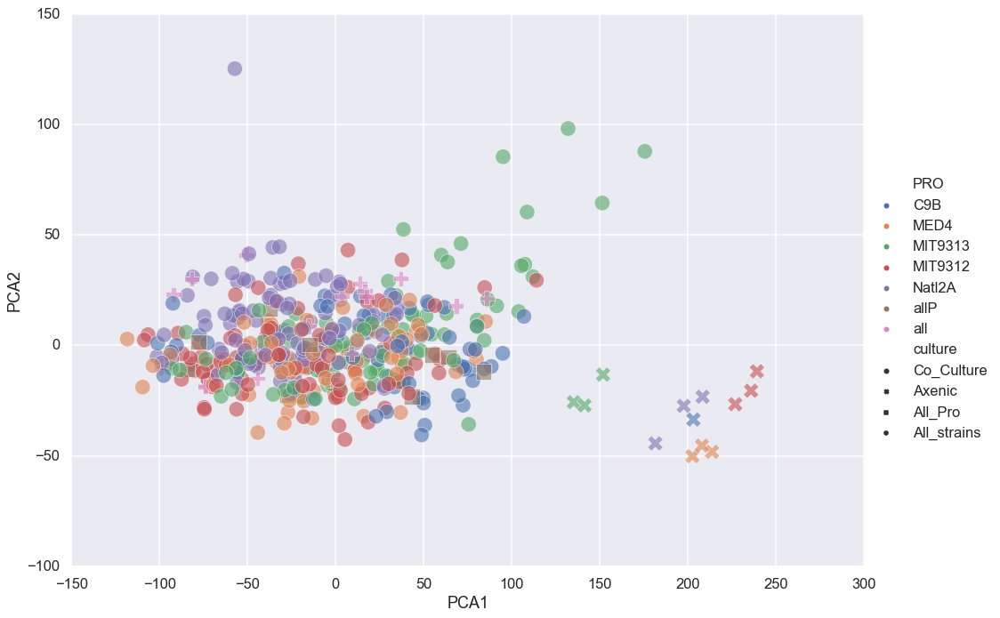

In [102]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

In [103]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.59388566 0.16034033]


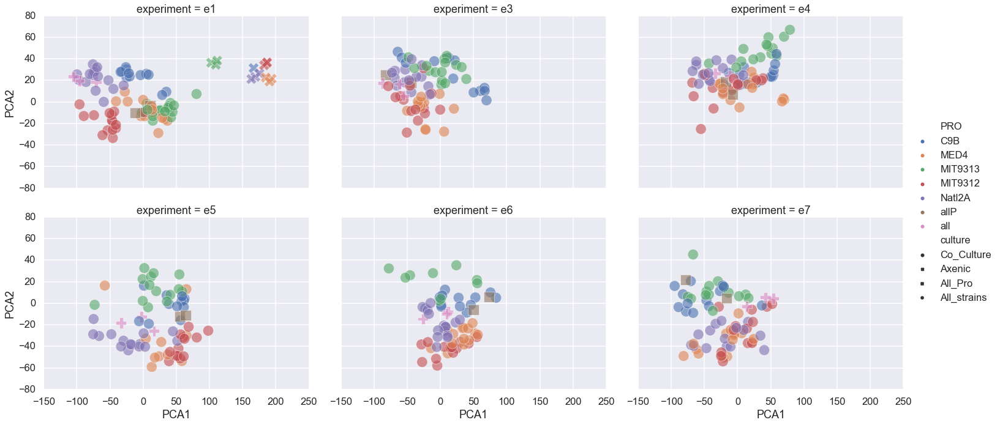

In [104]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

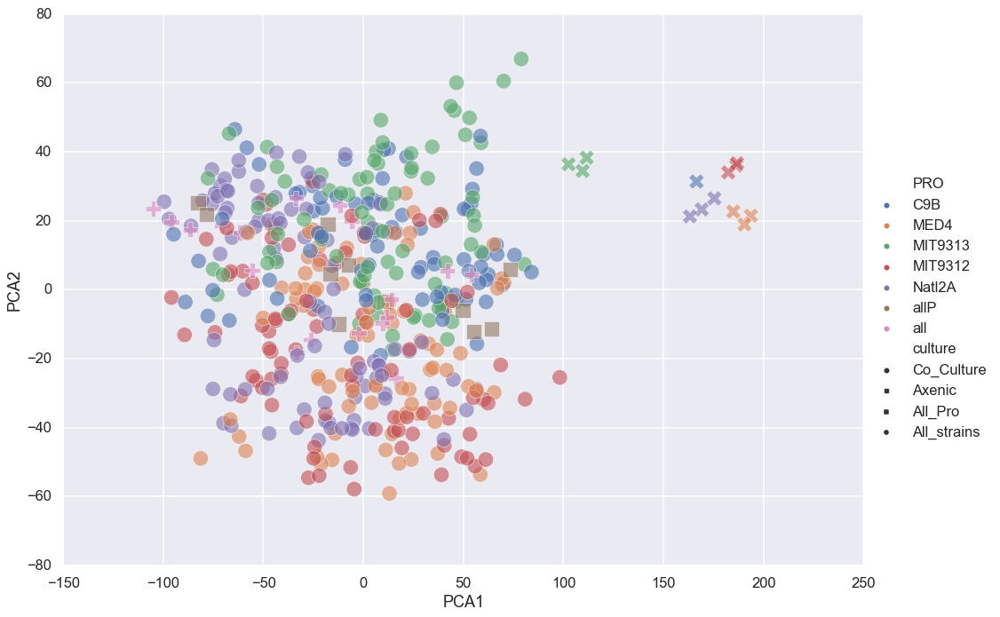

In [105]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

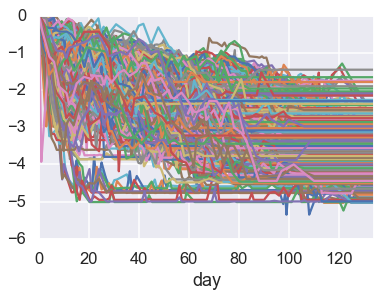

In [106]:
X.T.plot(legend=False)

In [107]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4573304157549234


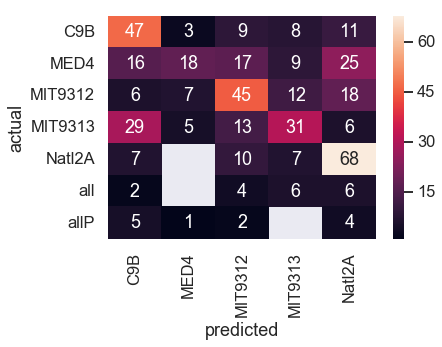

In [108]:
cp.forest_heatmap(clf=clf, X=X, y=y)

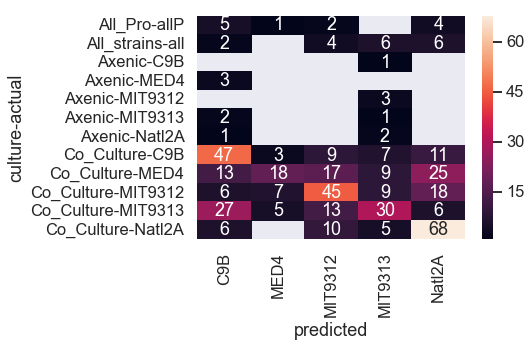

In [109]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

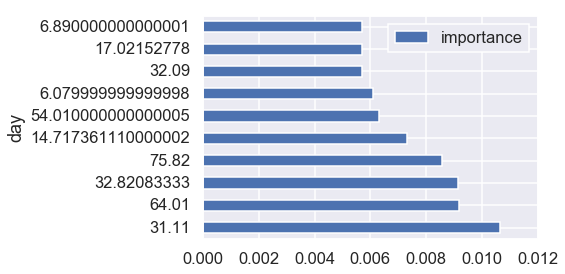

In [110]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [111]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5733041575492341


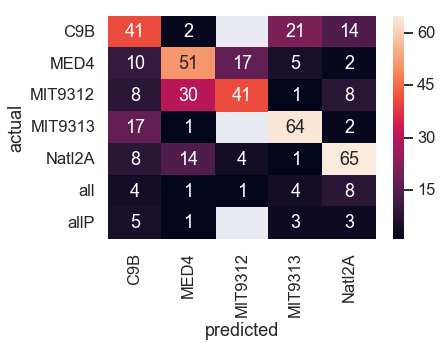

In [112]:
cp.forest_heatmap(clf=clf, X=X, y=y)

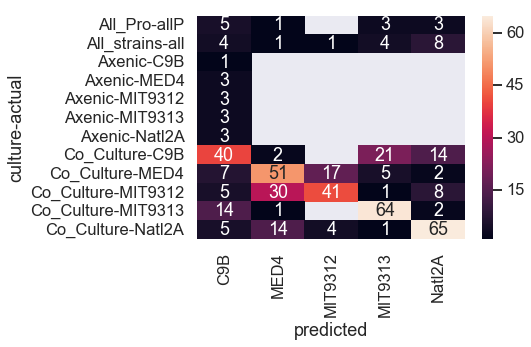

In [113]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

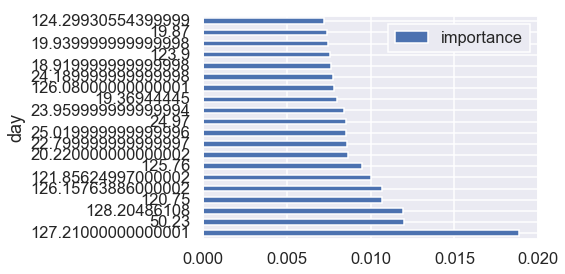

In [114]:
cp.forest_feature_importance(clf=clf, col_names=X.columns, n=20)

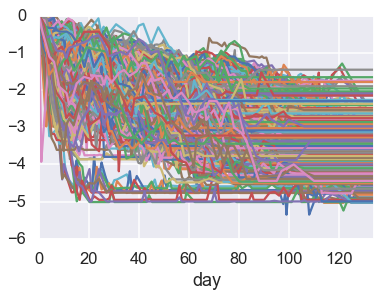

In [115]:
X.T.plot(legend=False)

In [116]:
gdecay = cp.generate_features(df=dfd.loc[dfd.experiment!= 'e2'])

In [118]:
gdecay.head()

,max,max_log,max_day,min,min_log,experiment,sample,PRO,ALT,culture,...,decay_min_log,decay_max_log,decay_mean_rate,decay_std_rate,decay_min_rate,decay_max_rate,decay_mean_log_rate,decay_std_log_rate,decay_min_log_rate,decay_max_log_rate
experiment_sample,,,,,,,,,,,,,,,,,,,,,
"e1, 10A",1.0,0.0,0.0,0.029532,-3.522277,e1,10A,C9B,DE,Co_Culture,...,-3.522277,0.0,-0.010617,0.051323,-0.313953,0.097604,-0.022857,0.190016,-0.649153,0.877455
"e1, 10B",1.0,0.0,0.0,0.029329,-3.529191,e1,10B,C9B,DE,Co_Culture,...,-3.529191,0.0,-0.009461,0.049344,-0.280531,0.127541,-0.016060,0.193148,-0.703601,1.047777
"e1, 10C",1.0,0.0,0.0,0.019460,-3.939393,e1,10C,C9B,DE,Co_Culture,...,-3.939393,0.0,-0.010714,0.046455,-0.295643,0.066869,-0.030027,0.206337,-0.896328,0.744343
"e1, 11A",1.0,0.0,0.0,0.006945,-4.969674,e1,11A,MED4,DE1,Co_Culture,...,-4.969674,0.0,-0.009242,0.039119,-0.283710,0.022025,-0.033691,0.181854,-0.539666,0.460682
"e1, 11B",1.0,0.0,0.0,0.007026,-4.958078,e1,11B,MED4,DE1,Co_Culture,...,-4.958078,0.0,-0.008846,0.036261,-0.238553,0.025739,-0.038233,0.190413,-0.717497,0.583652


In [119]:
X = cp.features2X(gdecay)
y = gdecay['PRO']
metadf = cp.get_meta(gdecay, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

0.5711159737417943


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


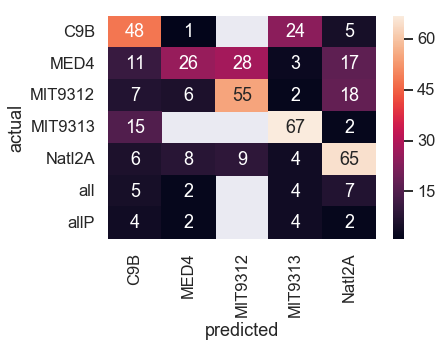

In [120]:
cp.forest_heatmap(clf=clf, X=X, y=y)

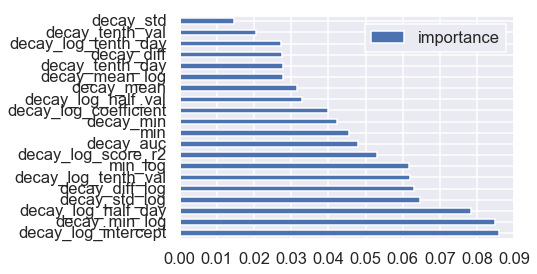

In [122]:
cp.forest_feature_importance(clf=clf, col_names=X.columns, n=20)

# experiments 3,4,5, down curve, first 79 days

In [174]:
dfd1 = dfd1.loc[dfd1.day < 79]

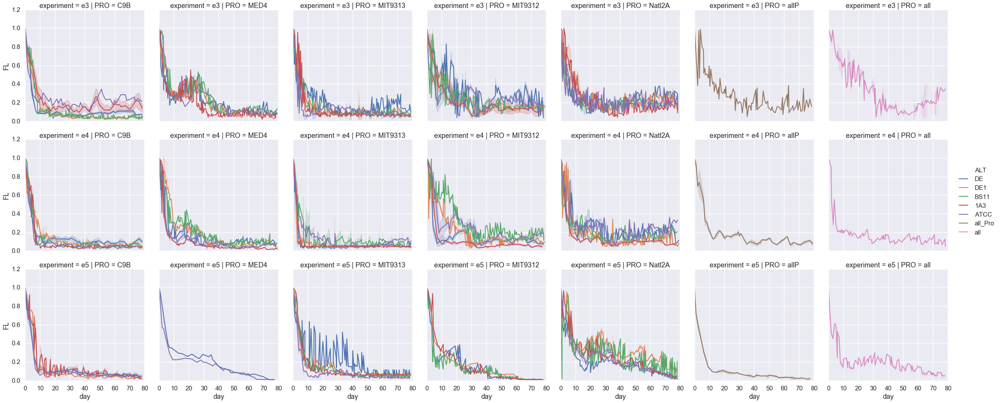

In [217]:
sns.relplot(data=dfd1, x='day', y='FL', row='experiment', col='PRO', hue='ALT', 
           kind='line', ci='sd')

In [175]:
X = cp.experiments2X(dfd1)
metadf = cp.get_meta(dfd1)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.85340596 0.09576494]


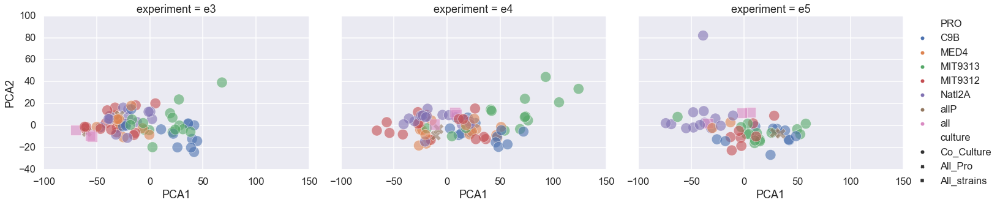

In [176]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

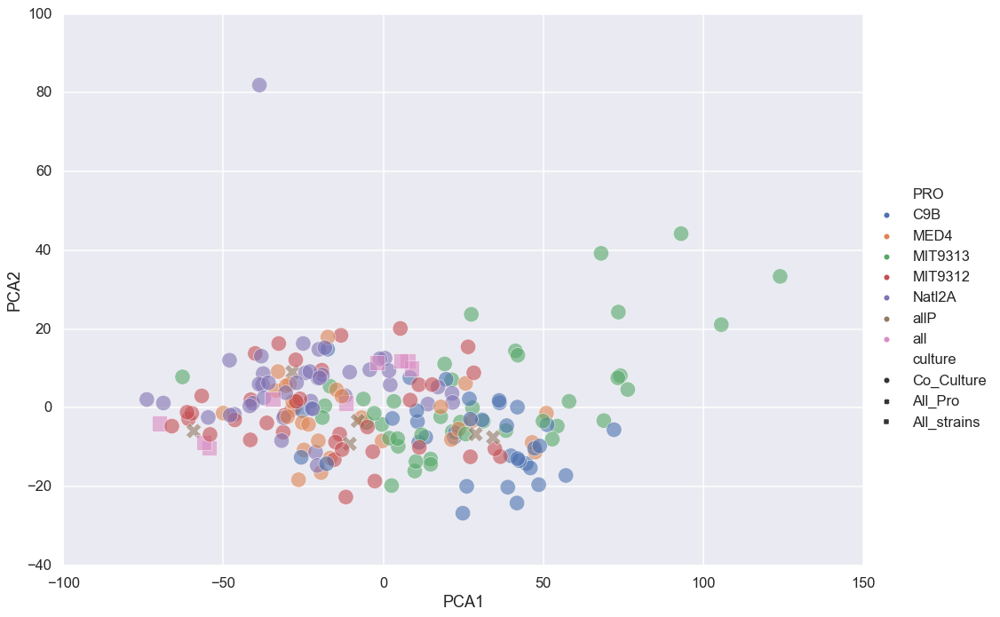

In [177]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

In [218]:
X1 = cp.experiments2X(dfd1, cumsummode=False)
X1.columns = 'logFL_' + X1.columns.astype(str)
X2 = cp.experiments2X(dfd1, cumsummode=False, value_col='rateFL')
X2.columns = 'rate_' + X2.columns.astype(str)
X = pd.concat([X1, X2], axis=1).fillna(0)
#X1.isna().sum().sum(), X2.isna().sum().sum(), X.isna().sum().sum()
metadf = cp.get_meta(dfd1)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.31786516 0.07551353]


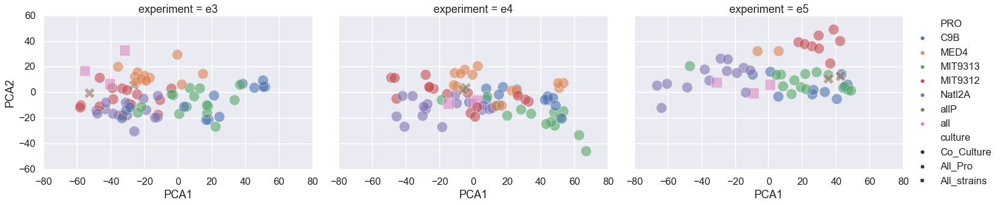

In [219]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

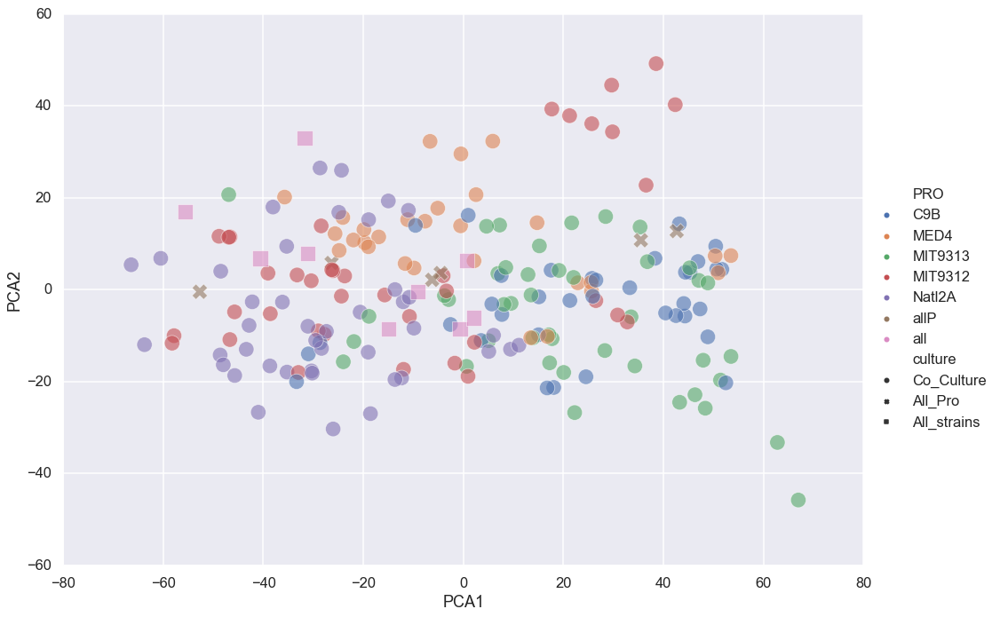

In [220]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

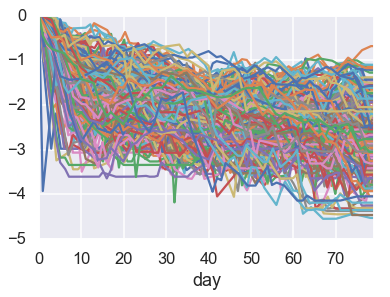

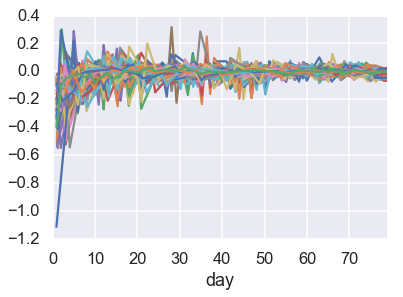

In [199]:
X1.T.plot(legend=False); X2.T.plot(legend=False)

In [237]:
X1 = cp.experiments2X(dfd1, cumsummode=False)
X1.columns = 'logFL_' + X1.columns.astype(str)
X2 = cp.experiments2X(dfd1, cumsummode=False, value_col='rateFL')
X2.columns = 'rate_' + X2.columns.astype(str)

X = pd.concat([X1, X2], axis=1).fillna(0)

metadf = cp.get_meta(dfd1)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.7339901477832512


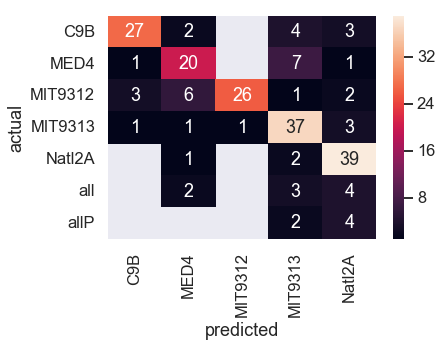

In [238]:
cp.forest_heatmap(clf=clf, X=X, y=y)

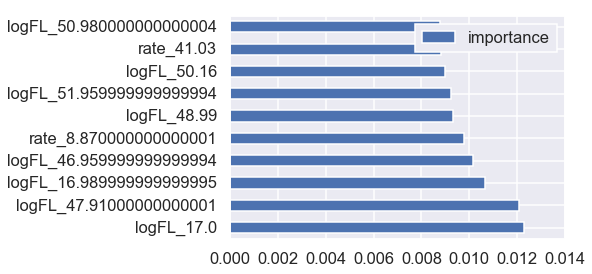

In [239]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

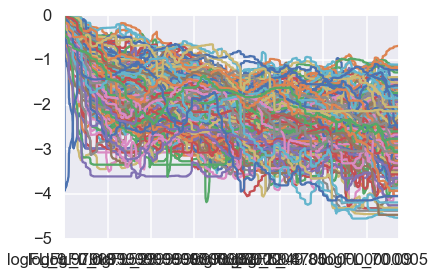

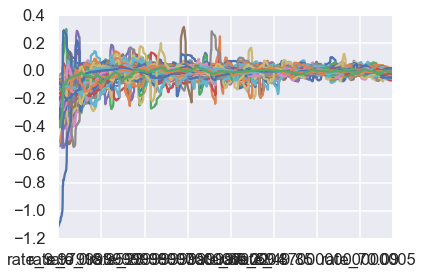

In [240]:
X1.T.plot(legend=False)
X2.T.plot(legend=False)


In [233]:
gdecay = cp.generate_features(df=dfd1)

In [234]:
X = cp.features2X(gdecay)
y = gdecay['PRO']
metadf = cp.get_meta(gdecay, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

0.5467980295566502


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Osnat\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


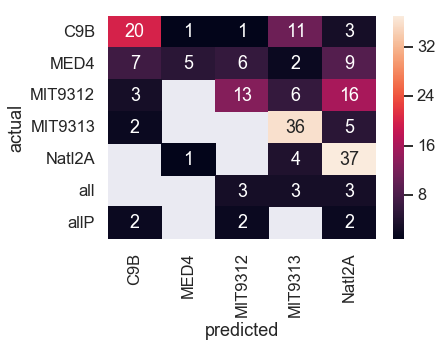

In [235]:
cp.forest_heatmap(clf=clf, X=X, y=y)

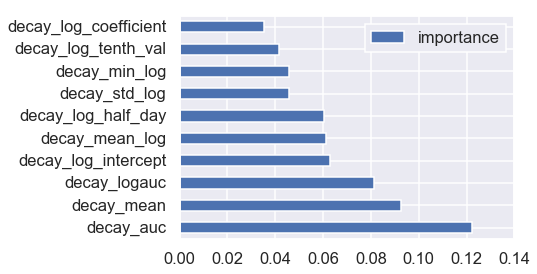

In [236]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)